# Run STitch3D on the DLPFC dataset

In this tutorial, we show STitch3D's analysis of the human dorsolateral prefrontal cortex (DLPFC) dataset. 

The spatial transcriptomics DLPFC data are publicly available at https://github.com/LieberInstitute/spatialLIBD. 
The DLPFC dataset profiled by 10x Genomics Chromium platform is available at https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE144136.

## Import packages

In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import os
import sys

import STitch3D

import warnings
warnings.filterwarnings("ignore")

os.environ["CUDA_VISIBLE_DEVICES"] = "0"

## Preprocessing

### Load datasets

Load single-cell reference dataset:

In [2]:
adata_ref = sc.read_h5ad("./data/adata_sc.h5ad")
adata_ref = adata_ref[adata_ref.obs.condition.values.astype(str)=="Control", :]

Load spatial transcriptomics datasets:

In [3]:
#spatial data
anno_df = pd.read_csv('./data/spatialLIBD/barcode_level_layer_map.tsv', sep='\t', header=None)

slice_idx = [151673, 151674, 151675, 151676]

adata_st1 = sc.read_visium(path="./data/spatialLIBD/%d" % slice_idx[0],
                          count_file="%d_filtered_feature_bc_matrix.h5" % slice_idx[0])
anno_df1 = anno_df.iloc[anno_df[1].values.astype(str) == str(slice_idx[0])]
anno_df1.columns = ["barcode", "slice_id", "layer"]
anno_df1.index = anno_df1['barcode']
adata_st1.obs = adata_st1.obs.join(anno_df1, how="left")
adata_st1 = adata_st1[adata_st1.obs['layer'].notna()]

adata_st2 = sc.read_visium(path="./data/spatialLIBD/%d" % slice_idx[1],
                          count_file="%d_filtered_feature_bc_matrix.h5" % slice_idx[1])
anno_df2 = anno_df.iloc[anno_df[1].values.astype(str) == str(slice_idx[1])]
anno_df2.columns = ["barcode", "slice_id", "layer"]
anno_df2.index = anno_df2['barcode']
adata_st2.obs = adata_st2.obs.join(anno_df2, how="left")
adata_st2 = adata_st2[adata_st2.obs['layer'].notna()]

adata_st3 = sc.read_visium(path="./data/spatialLIBD/%d" % slice_idx[2],
                          count_file="%d_filtered_feature_bc_matrix.h5" % slice_idx[2])
anno_df3 = anno_df.iloc[anno_df[1].values.astype(str) == str(slice_idx[2])]
anno_df3.columns = ["barcode", "slice_id", "layer"]
anno_df3.index = anno_df3['barcode']
adata_st3.obs = adata_st3.obs.join(anno_df3, how="left")
adata_st3 = adata_st3[adata_st3.obs['layer'].notna()]

adata_st4 = sc.read_visium(path="./data/spatialLIBD/%d" % slice_idx[3],
                          count_file="%d_filtered_feature_bc_matrix.h5" % slice_idx[3])
anno_df4 = anno_df.iloc[anno_df[1].values.astype(str) == str(slice_idx[3])]
anno_df4.columns = ["barcode", "slice_id", "layer"]
anno_df4.index = anno_df4['barcode']
adata_st4.obs = adata_st4.obs.join(anno_df4, how="left")
adata_st4 = adata_st4[adata_st4.obs['layer'].notna()]

### Alignment of ST tissue slices

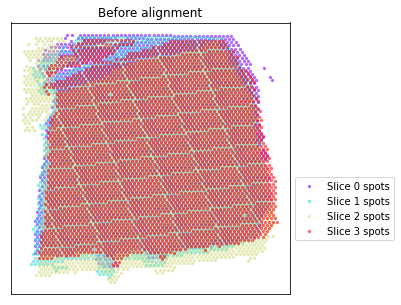

Using the Iterative Closest Point algorithm for alignemnt.
Detecting edges...
Aligning edges...


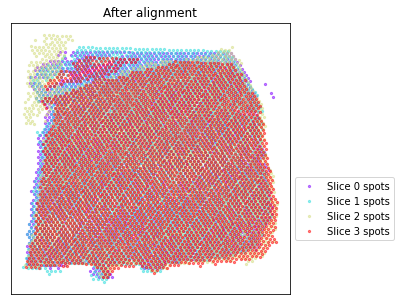

In [4]:
adata_st_list_raw = [adata_st1, adata_st2, adata_st3, adata_st4]
adata_st_list = STitch3D.utils.align_spots(adata_st_list_raw, plot=True)

### Selecting highly variable genes and building 3D spatial graph

In [5]:
celltype_list_use = ['Astros_1', 'Astros_2', 'Astros_3', 'Endo', 'Micro/Macro',
                     'Oligos_1', 'Oligos_2', 'Oligos_3',
                     'Ex_1_L5_6', 'Ex_2_L5', 'Ex_3_L4_5', 'Ex_4_L_6', 'Ex_5_L5',
                     'Ex_6_L4_6', 'Ex_7_L4_6', 'Ex_8_L5_6', 'Ex_9_L5_6', 'Ex_10_L2_4']

adata_st, adata_basis = STitch3D.utils.preprocess(adata_st_list, 
                                                  adata_ref, 
                                                  celltype_ref=celltype_list_use, 
                                                  sample_col="group",
                                                  slice_dist_micron=[10., 300., 10.],
                                                  n_hvg_group=500)

Finding highly variable genes...
4558 highly variable genes selected.
Calculate basis for deconvolution...
1 batches are used for computing the basis vector of cell type <Astros_1>.
17 batches are used for computing the basis vector of cell type <Astros_2>.
14 batches are used for computing the basis vector of cell type <Astros_3>.
17 batches are used for computing the basis vector of cell type <Endo>.
17 batches are used for computing the basis vector of cell type <Ex_10_L2_4>.
15 batches are used for computing the basis vector of cell type <Ex_1_L5_6>.
15 batches are used for computing the basis vector of cell type <Ex_2_L5>.
17 batches are used for computing the basis vector of cell type <Ex_3_L4_5>.
14 batches are used for computing the basis vector of cell type <Ex_4_L_6>.
17 batches are used for computing the basis vector of cell type <Ex_5_L5>.
16 batches are used for computing the basis vector of cell type <Ex_6_L4_6>.
16 batches are used for computing the basis vector of cell 

## Running STitch3D model

In [6]:
model = STitch3D.model.Model(adata_st, adata_basis)

model.train()

  0%|          | 2/20000 [00:00<1:29:35,  3.72it/s]

Step: 0, Loss: 2438.9314, d_loss: 2433.3323, f_loss: 55.9906


 10%|█         | 2002/20000 [06:09<55:06,  5.44it/s] 

Step: 2000, Loss: 745.4474, d_loss: 742.1439, f_loss: 33.0354


 20%|██        | 4002/20000 [12:20<49:15,  5.41it/s]

Step: 4000, Loss: 706.4982, d_loss: 703.2151, f_loss: 32.8299


 30%|███       | 6002/20000 [18:31<42:47,  5.45it/s]

Step: 6000, Loss: 697.4716, d_loss: 694.2027, f_loss: 32.6885


 40%|████      | 8002/20000 [24:43<37:00,  5.40it/s]

Step: 8000, Loss: 693.6924, d_loss: 690.4269, f_loss: 32.6556


 50%|█████     | 10002/20000 [30:55<31:00,  5.37it/s]

Step: 10000, Loss: 692.3774, d_loss: 689.1337, f_loss: 32.4372


 60%|██████    | 12002/20000 [37:08<24:44,  5.39it/s]

Step: 12000, Loss: 693.6156, d_loss: 690.3403, f_loss: 32.7528


 70%|███████   | 14002/20000 [43:20<18:21,  5.45it/s]

Step: 14000, Loss: 691.1208, d_loss: 687.8664, f_loss: 32.5445


 80%|████████  | 16002/20000 [49:31<12:17,  5.42it/s]

Step: 16000, Loss: 690.3745, d_loss: 687.1446, f_loss: 32.2987


 90%|█████████ | 18002/20000 [55:43<06:06,  5.45it/s]

Step: 18000, Loss: 689.8022, d_loss: 686.5756, f_loss: 32.2657


100%|██████████| 20000/20000 [1:01:54<00:00,  5.38it/s]


## Saving STitch3D results

In [7]:
save_path = "./results_DLPFC"
result = model.eval(adata_st_list_raw, save=True, output_path=save_path)

## Visualizing results in 2D

STitch3D's learned representations of spots in all slices are restored in "model.adata_st.obsm['latent']", which are used for spatial domain identification.

In [8]:
from sklearn.mixture import GaussianMixture

np.random.seed(1234)
gm = GaussianMixture(n_components=7, covariance_type='tied', init_params='kmeans')
y = gm.fit_predict(model.adata_st.obsm['latent'], y=None)
model.adata_st.obs["GM"] = y
model.adata_st.obs["GM"].to_csv(os.path.join(save_path, "clustering.txt"))

# Restoring clustering labels to result
order = [2,4,6,0,3,5,1] # reordering cluster labels
model.adata_st.obs["Cluster"] = [order[label] for label in model.adata_st.obs["GM"].values]
for i in range(len(result)):
    result[i].obs["GM"] = model.adata_st.obs.loc[result[i].obs_names, ]["GM"]
    result[i].obs["Cluster"] = model.adata_st.obs.loc[result[i].obs_names, ]["Cluster"]

Plotting spatial domains:

Slice 151673 spatial domain detection result:


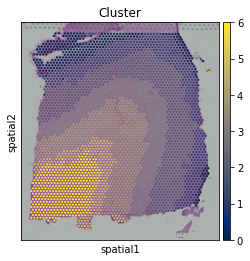

Slice 151674 spatial domain detection result:


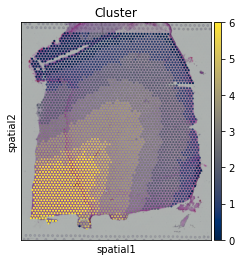

Slice 151675 spatial domain detection result:


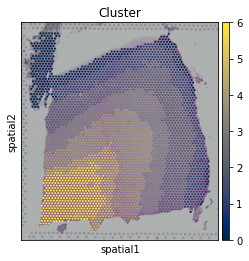

Slice 151676 spatial domain detection result:


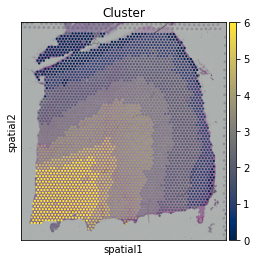

In [9]:
for i, adata_st_i in enumerate(result):
    print("Slice %d spatial domain detection result:" % slice_idx[i])
    sc.pl.spatial(adata_st_i, img_key="lowres", color="Cluster", color_map="cividis", size=1.)

Plotting cell-type proportions:

Slice 151673 cell-type deconvolution result:


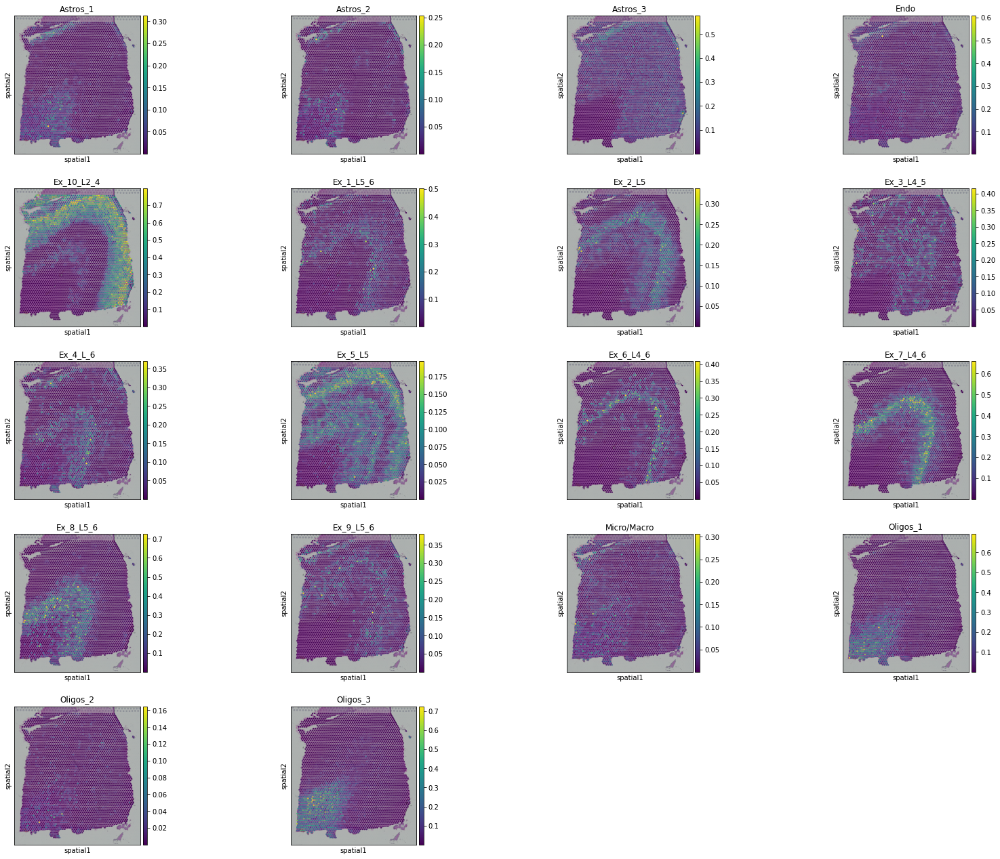

Slice 151674 cell-type deconvolution result:


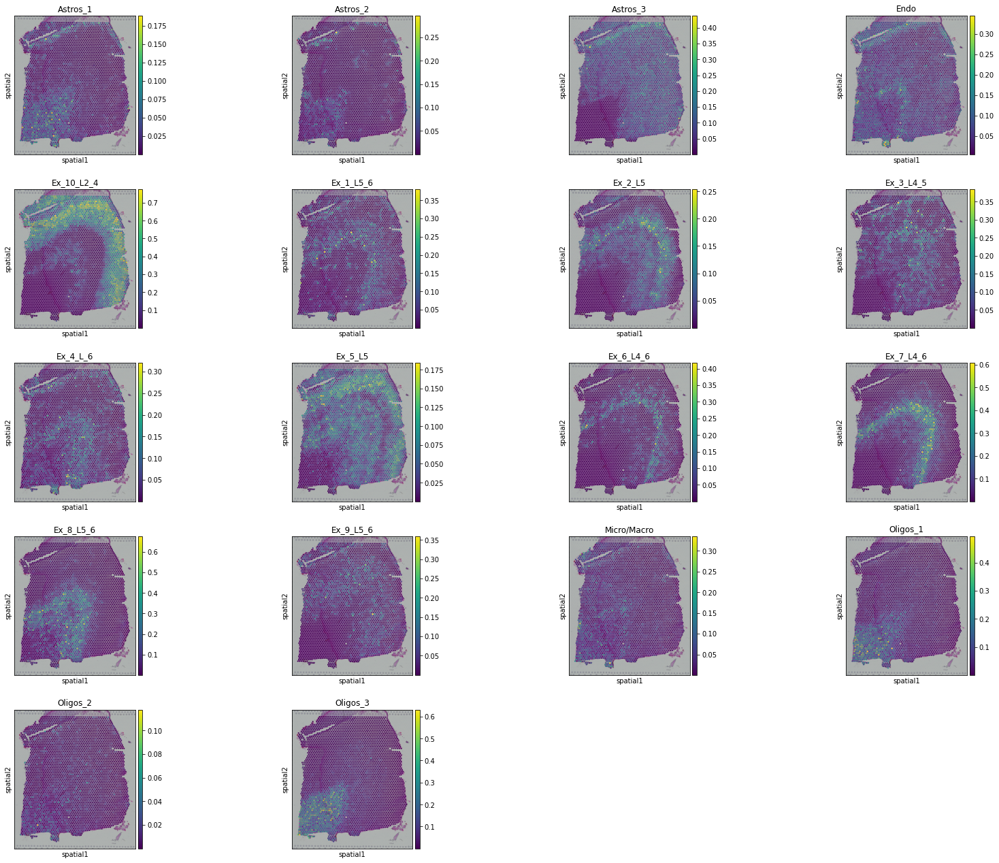

Slice 151675 cell-type deconvolution result:


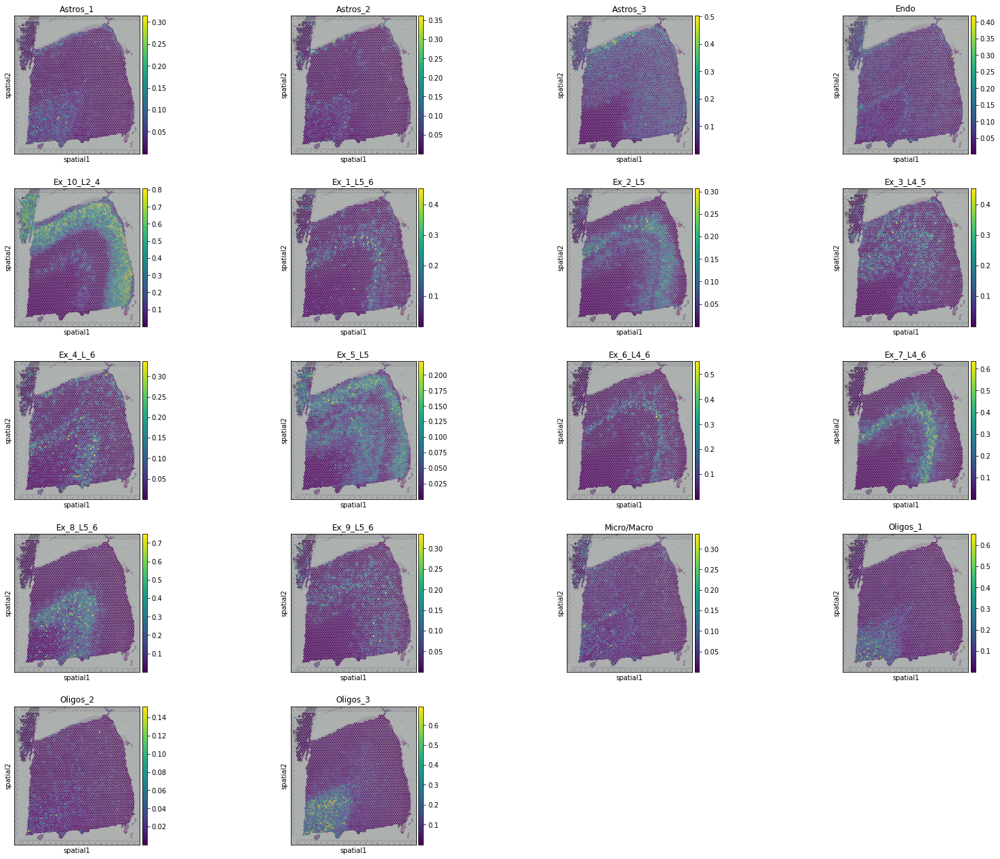

Slice 151676 cell-type deconvolution result:


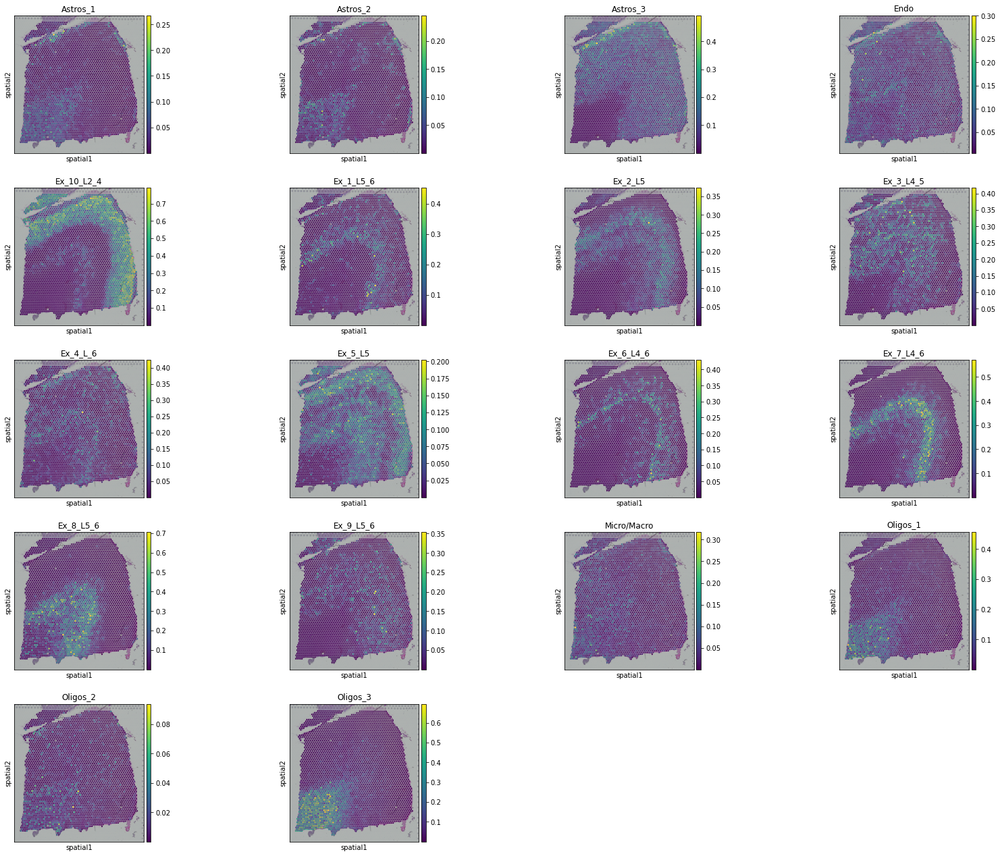

In [10]:
for i, adata_st_i in enumerate(result):
    print("Slice %d cell-type deconvolution result:" % slice_idx[i])
    sc.pl.spatial(adata_st_i, img_key="lowres", color=list(adata_basis.obs.index), size=1.)

Plotting UMAP:

In [11]:
import umap

reducer = umap.UMAP(n_neighbors=30,
                    n_components=2,
                    metric="correlation",
                    n_epochs=None,
                    learning_rate=1.0,
                    min_dist=0.3,
                    spread=1.0,
                    set_op_mix_ratio=1.0,
                    local_connectivity=1,
                    repulsion_strength=1,
                    negative_sample_rate=5,
                    a=None,
                    b=None,
                    random_state=1234,
                    metric_kwds=None,
                    angular_rp_forest=False,
                    verbose=True)

embedding = reducer.fit_transform(model.adata_st.obsm['latent'])

n_spots = embedding.shape[0]
size = 120000 / n_spots

UMAP(angular_rp_forest=True, dens_frac=0.0, dens_lambda=0.0,
     local_connectivity=1, metric='correlation', min_dist=0.3, n_neighbors=30,
     random_state=1234, repulsion_strength=1, verbose=True)
Construct fuzzy simplicial set
Thu Feb  2 15:11:04 2023 Finding Nearest Neighbors
Thu Feb  2 15:11:04 2023 Building RP forest with 11 trees
Thu Feb  2 15:11:05 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Thu Feb  2 15:11:17 2023 Finished Nearest Neighbor Search
Thu Feb  2 15:11:20 2023 Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Feb  2 15:11:35 2023 Finished embedding


Obtaining spatial trajectory with PAGA (https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.paga.html).

In [12]:
model.adata_st.obsm["X_umap"] = embedding
sc.pp.neighbors(model.adata_st, use_rep='latent')
sc.tl.paga(model.adata_st, groups='layer')

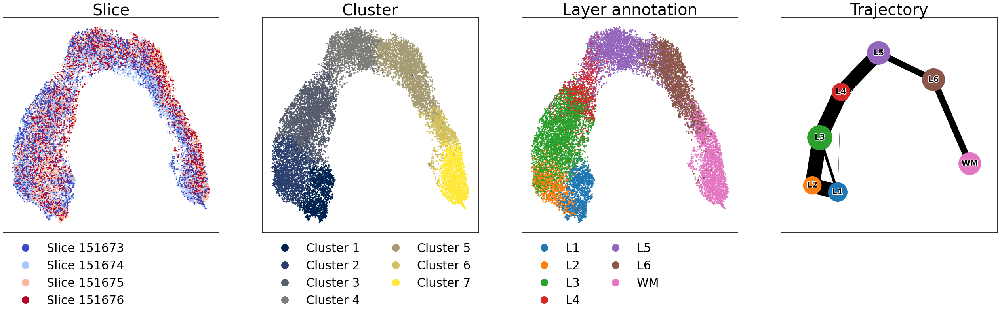

In [13]:
from sklearn import preprocessing
from matplotlib.colors import ListedColormap

le_slice = preprocessing.LabelEncoder()
label_slice = le_slice.fit_transform(model.adata_st.obs['slice_id'])

le_layer = preprocessing.LabelEncoder()
label_layer = le_layer.fit_transform(model.adata_st.obs['layer'])

np.random.seed(1234)
order = np.arange(n_spots)
np.random.shuffle(order)

f = plt.figure(figsize=(45,10))

ax1 = f.add_subplot(1,4,1)
scatter1 = ax1.scatter(embedding[order, 0], embedding[order, 1], 
                       s=size, c=label_slice[order], cmap='coolwarm')
ax1.set_title("Slice", fontsize=40)
ax1.tick_params(axis='both',bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False, grid_alpha=0)

l1 = ax1.legend(handles=scatter1.legend_elements()[0], 
                labels=["Slice %d" % i for i in slice_idx], 
                loc="upper left", bbox_to_anchor=(0., 0.), 
                markerscale=3., title_fontsize=45, fontsize=30, frameon=False, ncol=1)
l1._legend_box.align = "left"


ax2 = f.add_subplot(1,4,2)
scatter2 = ax2.scatter(embedding[order, 0], embedding[order, 1], 
                       s=size, c=model.adata_st.obs['Cluster'][order], cmap='cividis')
ax2.set_title("Cluster", fontsize=40)
ax2.tick_params(axis='both',bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False, grid_alpha=0)

l2 = ax2.legend(handles=scatter2.legend_elements()[0], 
                labels=["Cluster %d" % i for i in range(1, 8)], 
                loc="upper left", bbox_to_anchor=(0., 0.), 
                markerscale=3., title_fontsize=45, fontsize=30, frameon=False, ncol=2)

l2._legend_box.align = "left"

ax3 = f.add_subplot(1,4,3)
scatter3 = ax3.scatter(embedding[order, 0], embedding[order, 1], 
                       s=size, c=label_layer[order], cmap=ListedColormap(["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b", "#e377c2"]))
ax3.set_title("Layer annotation", fontsize=40)
ax3.tick_params(axis='both',bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False, grid_alpha=0)

l3 = ax3.legend(handles=scatter3.legend_elements()[0], 
                labels=sorted(set(adata_st.obs['layer'].values)), 
                loc="upper left", bbox_to_anchor=(0., 0.), 
                markerscale=3., title_fontsize=45, fontsize=30, frameon=False, ncol=2)

l3._legend_box.align = "left"

ax4 = f.add_subplot(1,4,4)
ax4.set_title("Trajectory", fontsize=40)
ax4.tick_params(axis='both',bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False, grid_alpha=0)
ax4.set_xlim(ax3.get_xlim())
ax4.set_ylim(ax3.get_ylim())

pos = []
for layer in ["L1", "L2", "L3", "L4", "L5", "L6", "WM"]:
    center = np.mean(embedding[model.adata_st.obs['layer'].values.astype(str)==layer, :], axis=0)
    pos.append(center)

sc.pl.paga(adata_st, pos=np.array(pos), node_size_scale=20, edge_width_scale=5, fontsize=20, fontoutline=3, ax=ax4)

f.subplots_adjust(hspace=.1, wspace=.1)
plt.show()